<div class="title">Detecting Tooth Cavities</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <h1 style="color:#4AC4FF; margin-top:0;">Project Overview</h1>
  <p style="font-size:17px; line-height:1.6; color:white;">
    Oral health is vital, yet many people face barriers to timely dental diagnostics due to cost, distance, or lack of specialists. AI-powered computer vision can automate early cavity detection from standard images, enabling faster intervention and reducing the burden on dental professionals.
  </p>
  <p style="font-size:17px; line-height:1.6; color:white;">
    This project applies deep learning for tooth detection and cavity classification—not to replace dentists, but to enhance workflows and user tools for virtual checkups, treatment monitoring, and preventive care. The dataset consists of <b>481 images</b> annotated with two classes: <b>normal</b> and <b>cavity</b>.
  </p>

  <h2 style="color:#4AC4FF; margin-top:0;">Achievements</h2>
  <p style="font-size:17px; line-height:1.6; color:white;">
    Achieved an <b>acceptable YOLOv12m model</b> for tooth detection and cavity classification. By addressing the challenges mentioned below, we can further improve accuracy and model robustness.
  </p>

  <h2 style="color:#4AC4FF;">Challenges Faced</h2>
  <ul style="font-size:17px; line-height:1.6; color:white; padding-left:20px;">
    <li>Some dataset labels are inaccurate and could benefit from segmentation-based annotations.</li>
    <li>Limited dataset size; more samples needed by merging datasets.</li>
    <li>Models trained on high-quality RGB images may underperform on noisy or low-quality images; more diverse data is needed for robustness.</li>
  </ul>

  <h2 style="color:#4AC4FF;">Future Work</h2>
  <p style="font-size:17px; line-height:1.6; color:white;">
    To address these challenges, future improvements could include:
  </p>
  <ul style="font-size:17px; line-height:1.6; color:white; padding-left:20px;">
    <li>Improving annotation quality and consistency.</li>
    <li>Expanding datasets with varied image quality and environmental conditions.</li>
    <li>Applying advanced augmentation techniques, noise simulation, and domain adaptation.</li>
    <li>Testing model performance on low-quality, noisy images to ensure real-world applicability.</li>
  </ul>

</div>


<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Application
  </h2>

</div>


![App View](https://raw.githubusercontent.com/DanialSoleimany/YOLOv12-Tooth-Cavity-Detection/main/app-view.png)


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    Based on what we said in the conclusion part, the <b>YOLOv12m</b> model fine-tuned will be used to implement our web application, developed using HTML, CSS, and JavaScript.
  </p>

  <div class="button-row right">
    <a href="https://github.com/DanialSoleimany/YOLOv12-Tooth-Cavity-Detection/tree/main" class="fancy-button plum">Application</a>
  </div>

</div>


In [1]:
import requests
from IPython.display import HTML

styles_url = "https://raw.githubusercontent.com/DanialSoleimany/YOLOv12-Tooth-Cavity-Detection/main/notebook%20styles/styles.py"

exec(requests.get(styles_url).text)

HTML(styles)

# <div class="title">Table of Contents</div>


<div class="toc-container">
    <a href="install-lib" class="button">Install Libraries</a>
  <a href="#libraries" class="button">Import Libraries</a>
  <a href="#business-understanding" class="button">Business Understanding</a>
  <a href="#data-understanding" class="button">Data Understanding</a>
  <a href="#data-preparation" class="button">Data Preparation</a>
  <a href="#modeling" class="button">Modeling</a>
  <a href="#evaluation" class="button">Evaluation</a>
  <a href="#cd" class="button">Conclusion & Discussion</a>
  <a href="#deployment" class="button">Deployment</a>
</div>


<div class="title">Install Libraries</div>


In [3]:
!pip install roboflow ultralytics pyyaml -q

<div id="install-lib" class="title">Import Libraries</div>


In [2]:
import os
import random
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch
import yaml
from roboflow import Roboflow
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# <div id="business-understanding" class="title">Business Understanding</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

<h3 style="color:#4AC4FF;">Introduction</h3>

  <p style="font-size:17px; line-height:1.6; color:white;">
    Oral health is a critical component of overall well-being, yet millions of people worldwide face barriers to timely dental diagnostics due to limited access to specialists, high costs, or geographical constraints. Delayed detection of dental issues such as cavities can lead to worsening oral conditions, higher treatment costs, and even systemic health problems.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    With advancements in <b>AI-powered health technology</b>, there is an emerging opportunity to automate early-stage dental screening using standard photographic images. By leveraging <b>computer vision</b>, it is possible to develop intelligent systems capable of identifying and classifying individual teeth under real-world conditions—supporting early intervention and reducing the burden on dental professionals.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    This project explores the application of <b>deep learning</b> for tooth detection and cavity classification. It aims not to replace dentists, but to enhance both professional workflows and user-side tools. Potential applications include <b>virtual dental checkups</b>, <b>orthodontic treatment monitoring</b>, <b>smile analysis</b>, and more. Such solutions can make preventive dental care more accessible, scalable, and cost-effective.
  </p>

</div>



# <div id="data-understanding" class="title">Data Understanding</div>


<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Data Collection
  </h2>

</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    In this step, we use the <b>Roboflow Python SDK</b> to access and download the <b>Cavity</b> dataset directly from the Roboflow platform. By specifying the project name and version, we ensure that we are working with the correct dataset release. Finally, we download the dataset in the <b>YOLOv12</b> format, which is fully compatible with our training pipeline. This approach streamlines dataset acquisition, avoiding manual downloads and ensuring the data structure is ready for immediate use in model training.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    <b>Dataset Source:</b> <a href="https://universe.roboflow.com/roboflow-100/cavity-rs0uf" target="_blank" style="color:#4AC4FF;">Cavity Dataset on Roboflow</a>
  </p>

</div>


In [3]:
# source -> https://universe.roboflow.com/roboflow-100/cavity-rs0uf

rf = Roboflow(api_key="your_api_key")
project = rf.workspace("roboflow-100").project("cavity-rs0uf")
version = project.version(3)
dataset = version.download("yolov12")              

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to cavity-3 in yolov12:: 100%|██████████| 848/848 [00:00<00:00, 7638.39it/s]


<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Understanding the Dataset Structure
  </h2>

</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    The dataset used in this project follows a standard directory structure compatible with YOLO-based training. It is organized under a root folder called <code>cavity-3/</code> as shown below:
  </p>

  <pre style="background-color: #1B1B1B; padding: 12px; border-radius: 10px; font-size: 16px; color: #4AC4FF; overflow-x: auto;">
cavity-3/
├── data.yaml
├── train/
│   ├── images/
│   └── labels/
├── valid/
│   ├── images/
│   └── labels/
├── test/
    ├── images/
    └── labels/
  </pre>

  <p style="font-size:17px; line-height:1.6; color:white;">
    Here’s what each component means:
  </p>

  <ul style="font-size:17px; line-height:1.6; color:white;">
    <li><b>data.yaml</b>: This file defines the dataset configuration for YOLO training. It includes paths to training, validation, and testing folders as well as the class names (e.g., <code>['Normal', 'Cavity']</code>).</li>
    <li><b>train/images/</b>: Contains the training images used to teach the model how to detect and classify teeth.</li>
    <li><b>train/labels/</b>: Contains YOLO-format label files for each training image. These files define the bounding box coordinates and class ID.</li>
    <li><b>valid/images/</b> and <b>valid/labels/</b>: Similar to the training folders but used for evaluating model performance during training.</li>
    <li><b>test/images/</b> and <b>test/labels/</b>: These are used to evaluate the model after training is complete. The test set simulates how the model will perform on unseen data.</li>
  </ul>

</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <h2 style="color:#4AC4FF;">Customizing <code>data.yaml</code> for Kaggle Environments</h2>

  <p style="font-size:17px; line-height:1.6; color:white;">
    When working with YOLO-based models, the <code>data.yaml</code> file is essential for defining the paths to training, validation, and test datasets. However, in Kaggle notebooks, dataset folders are often placed in the path <code>/kaggle/working</code>, which may not match the default paths originally defined in the YAML file.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    Since Kaggle restricts manual editing of files within the <code>/kaggle/input</code> directory, it becomes necessary to create a copy of the dataset in the <code>/kaggle/working</code> directory and personalize the <code>data.yaml</code> file accordingly. This includes updating the paths for <b>train</b>, <b>validation</b>, and <b>test</b> image folders to match the structure of your current working environment.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    By adjusting these paths, you ensure that the YOLO training pipeline can correctly locate and use your dataset without errors. This step is crucial for smooth training and evaluation in Kaggle, where static file editing is often limited.
  </p>

</div>


In [6]:
yaml_path = "/kaggle/working/cavity-3/data.yaml"

with open(yaml_path, 'r') as file:
    data = yaml.safe_load(file)

data

{'train': '../train/images',
 'val': '../valid/images',
 'test': '../test/images',
 'nc': 2,
 'names': ['cavity', 'normal'],
 'roboflow': {'workspace': 'roboflow-100',
  'project': 'cavity-rs0uf',
  'version': 3,
  'license': 'CC BY 4.0',
  'url': 'https://universe.roboflow.com/roboflow-100/cavity-rs0uf/dataset/3'}}

In [9]:
data['train'] = '/kaggle/working/cavity-3/train/images'
data['val'] = '/kaggle/working/cavity-3/valid/images'
data['test'] = '/kaggle/working/cavity-3/test/images'

In [10]:
with open(yaml_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Visulize 5×5 Grid of Training Samples with Labels
  </h2>

</div>


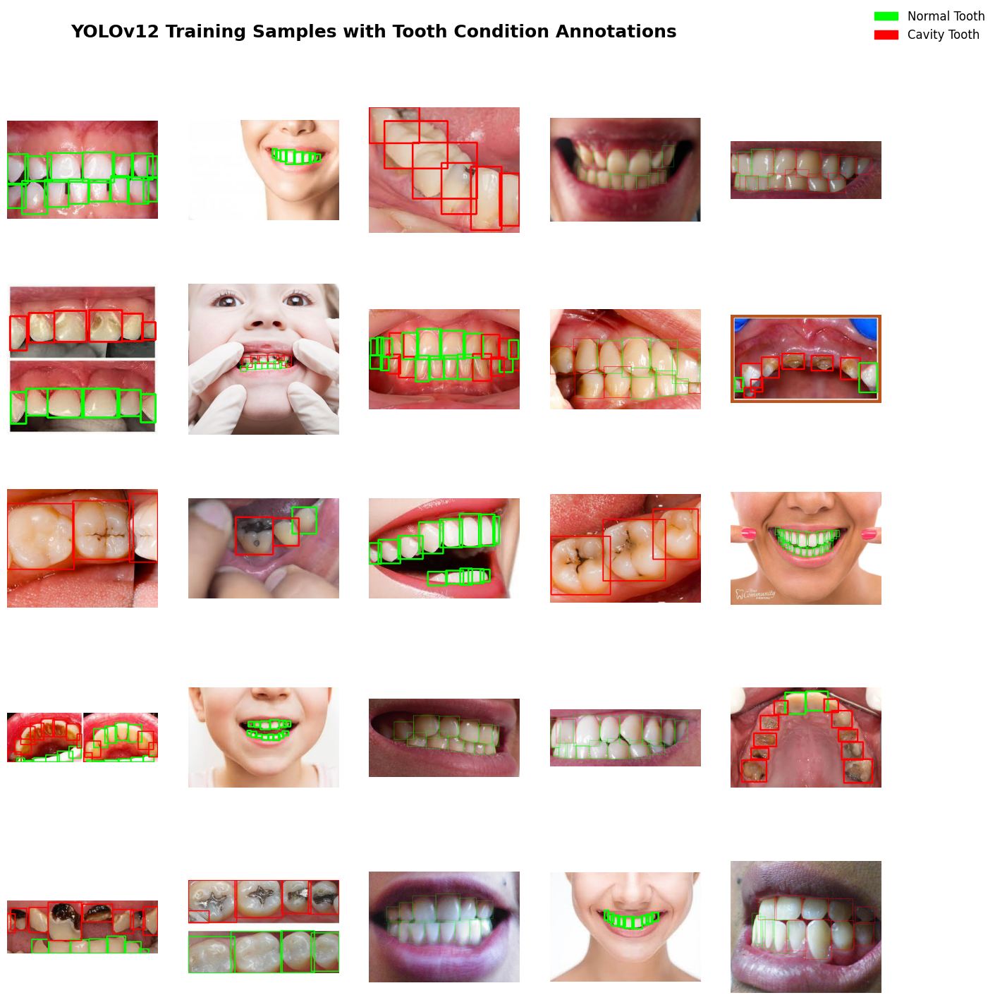

In [ ]:
train_root = Path("/kaggle/working/cavity-3/train")  
images_dir = train_root / "images"
labels_dir = train_root / "labels"

class_names = ["Cavity Tooth", "Normal Tooth"] 
colors = {
    "Cavity Tooth": (0, 0, 255),   
    "Normal Tooth": (0, 255, 0)   
}
# ============================================

def yolo_to_xyxy(box, img_w, img_h):
    x_c, y_c, w, h = box
    x_c *= img_w
    y_c *= img_h
    w   *= img_w
    h   *= img_h
    x1 = int(max(0, x_c - w / 2))
    y1 = int(max(0, y_c - h / 2))
    x2 = int(min(img_w - 1, x_c + w / 2))
    y2 = int(min(img_h - 1, y_c + h / 2))
    return x1, y1, x2, y2

def read_labels(label_path):
    items = []
    if not label_path.exists():
        return items
    with label_path.open("r", encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            cls = int(float(parts[0]))
            x_c, y_c, w, h = map(float, parts[1:])
            items.append((cls, [x_c, y_c, w, h]))
    return items

def draw_boxes(img_bgr, labels):
    h, w = img_bgr.shape[:2]
    out = img_bgr.copy()
    for cls, box in labels:
        x1, y1, x2, y2 = yolo_to_xyxy(box, w, h)
        label = class_names[cls]
        color = colors.get(label, (255, 255, 255))
        cv2.rectangle(out, (x1, y1), (x2, y2), color, 2)
    return out

img_exts = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}
all_images = [p for p in images_dir.glob("*") if p.suffix.lower() in img_exts]

if not all_images:
    raise FileNotFoundError(f"No images found in {images_dir}")

sample_images = random.sample(all_images, k=min(25, len(all_images)))

rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(16, 16))

plt.subplots_adjust(top=0.92)

fig.suptitle("YOLOv12 Training Samples with Tooth Condition Annotations", fontsize=18, fontweight='bold', x=0.45)

# Legend
red_patch = mpatches.Patch(color=(1, 0, 0), label='Cavity Tooth')
green_patch = mpatches.Patch(color=(0, 1, 0), label='Normal Tooth')
fig.legend(handles=[green_patch, red_patch], loc='upper right', fontsize=12, frameon=False)

idx = 0
for r in range(rows):
    for c in range(cols):
        ax = axes[r, c]
        if idx < len(sample_images):
            img_path = sample_images[idx]
            label_path = labels_dir / (img_path.stem + ".txt")
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is not None:
                img_annot = draw_boxes(img_bgr, read_labels(label_path))
                img_rgb = cv2.cvtColor(img_annot, cv2.COLOR_BGR2RGB)
                ax.imshow(img_rgb)
        ax.axis("off")
        idx += 1

plt.show()

<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 20px; border-radius: 15px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    The dataset, downloaded from <a href="https://universe.roboflow.com/roboflow-100/cavity-rs0uf" target="_blank" style="color:#4AC4FF;">Roboflow</a>, is annotated with two labels: <b>Normal Tooth</b> and <b>Cavity Tooth</b>. In the 5×5 grid of annotated training images, we can visually distinguish between these categories. Boxes in <span style="color:#4AC4FF;background:rgba(0,0,0,0.15);padding:0 4px;border-radius:4px;">green</span> highlight <b>Normal Tooth</b> samples—typically showing smooth, uniform enamel with consistent color and well-defined edges. In contrast, boxes in <span style="color:#FF5A5A;background:rgba(0,0,0,0.15);padding:0 4px;border-radius:4px;">red</span> indicate <b>Cavity Tooth</b> instances, which often present localized dark spots, surface irregularities, pits, or edge discoloration. Seeing both categories side by side not only reinforces the differences in appearance but also provides a clear visual reference for the type of features the YOLOv12 model learns to detect.
  </p>

</div>



# <div id="data-preparation" class="title">Data Preparation</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 20px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    For the data preparation stage, the dataset was obtained from <b>Roboflow</b> and was already formatted for training a YOLOv12 detection model. This meant that normalization or manual resizing was unnecessary, as the training image size can be specified directly within the YOLO configuration. 
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    While additional dataset preparation steps could have been applied, such as in-depth inspection and cleaning, these were not the primary focus of this work. Instead, the emphasis was placed on training and evaluating the models. It should also be noted that the dataset is relatively small and should be considered a <b>small-scale dataset</b> in terms of size.
  </p>

</div>


# <div id="#modeling" class="title">Modeling</div>


<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Download YOLOv12m Model
  </h2>

</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    In this section, we will download the <b>YOLOv12m</b> & <b>YOLOv12x</b> models to train our dataset.
  </p>

</div>


In [5]:
!wget https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo12m.pt

--2025-08-14 22:47:34--  https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo12m.pt
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/521807533/7ca4975a-7998-4ab1-a6f1-82979b6290ca?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-08-14T23%3A26%3A31Z&rscd=attachment%3B+filename%3Dyolo12m.pt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-08-14T22%3A26%3A04Z&ske=2025-08-14T23%3A26%3A31Z&sks=b&skv=2018-11-09&sig=l3g%2B8jTY8JcPhv2uuhz%2FQDsl84%2FkjvauzS9pmrrhUvY%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1NTIxMTk1NCwibmJmIjoxNzU1MjExNjU0LCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG9iLmN

In [37]:
!wget https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo12x.pt

--2025-08-15 00:10:51--  https://github.com/ultralytics/assets/releases/download/v8.3.0/yolo12x.pt
Resolving github.com (github.com)... 4.237.22.38
Connecting to github.com (github.com)|4.237.22.38|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/521807533/38c16fee-f912-46d3-a455-b442e265c41b?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-08-15T01%3A07%3A48Z&rscd=attachment%3B+filename%3Dyolo12x.pt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-08-15T00%3A07%3A45Z&ske=2025-08-15T01%3A07%3A48Z&sks=b&skv=2018-11-09&sig=2C09d%2BE6U4h0UJWkDIGhndoXlvXu9kl%2FAGRZKgRmDKI%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1NTIxNjk1MiwibmJmIjoxNzU1MjE2NjUyLCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG9iLmNvcmU

<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Fine-tuning YOLO Models
  </h2>

</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <h2 style="color:#4AC4FF;">YOLOv12m vs YOLOv12x – Fine-Tuning Plan</h2>

  <p style="font-size:17px; line-height:1.6; color:white;">
    In this section, the goal is to fine-tune both <b>YOLOv12m</b> and <b>YOLOv12x</b> on the given dataset to compare their evaluation performance. The <b>YOLOv12m</b> model is smaller and more lightweight compared to the larger and more complex <b>YOLOv12x</b>.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    To further explore performance differences, data augmentation will be applied <b>only</b> to the YOLOv12x training process, while YOLOv12m will be trained without augmentation. This setup will allow an analysis of whether the additional complexity of YOLOv12x combined with augmentation leads to measurable improvements over YOLOv12m.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    The intermediate training logs and raw output images have been cleared to keep this notebook concise. Detailed results and comparisons will be presented and discussed in the evaluation section.
  </p>

</div>


In [29]:
model_yolom = YOLO("/kaggle/working/yolo12m.pt")

In [28]:
# Fine-tuning YOLOv12m

model_yolom.train(
    data="/kaggle/working/cavity-3/data.yaml",
    epochs=200,
    imgsz=150,
    batch=64,
    task="detect" 
)

In [39]:
model_yolox = YOLO("/kaggle/working/yolo12x.pt")

In [27]:
# Fine-tuning YOLOv12x

model_yolox.train(
    data="/kaggle/working/cavity-3/data.yaml",
    epochs=200,
    imgsz=150,
    batch=64,
    task="detect",
    degrees=10,      
    translate=0.1,  
    scale=0.5,       
    shear=5,        
    perspective=0.0005,
    flipud=0.1,      
    fliplr=0.5,     
    hsv_h=0.015,    
    hsv_s=0.7,        
    hsv_v=0.4      
)

# <div id="#evaluation" class="title">Evaluation</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <h2 style="color:#4AC4FF;">Fine-tuned YOLOv12m vs YOLOv12x</h2>

  <p style="font-size:17px; line-height:1.6; color:white;">
    After training <b>YOLOv12m</b> for <b>183 epochs</b> (Early Stopping) and <b>YOLOv12x</b> for <b>200 epochs</b>, the best-performing weights (<code>best.pt</code>) of each model were evaluated on the same validation set of <b>93 images</b> containing <b>1,127 annotated teeth</b>. YOLOv12m consists of <b>169 layers</b> (~20.1M parameters), while YOLOv12x is a larger network with <b>283 layers</b> (~59.0M parameters).
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    In terms of overall detection performance, YOLOv12m achieved a <b>mAP@0.5</b> of <b>70.4%</b> and <b>mAP@0.5:0.95</b> of <b>38.4%</b>, while YOLOv12x improved these to <b>73.8%</b> and <b>42.4%</b> respectively. Precision increased from <b>69.7%</b> (m) to <b>72.8%</b> (x), and recall improved slightly from <b>67.1%</b> (m) to <b>69.4%</b> (x), suggesting that YOLOv12x not only makes more accurate predictions but also detects a slightly higher proportion of true positives.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    For the <b>Cavity Tooth</b> class, YOLOv12m achieved <b>73.6%</b> mAP@0.5, <b>69.8%</b> precision, and <b>63.8%</b> recall. YOLOv12x outperformed it with <b>75.4%</b> mAP@0.5, <b>71.9%</b> precision, and a notably higher <b>70.9%</b> recall, indicating a stronger ability to detect cavities more consistently.  
    For the <b>Normal Tooth</b> class, YOLOv12m reached <b>67.2%</b> mAP@0.5, <b>69.6%</b> precision, and <b>70.5%</b> recall, while YOLOv12x achieved <b>72.1%</b> mAP@0.5, <b>73.7%</b> precision, and <b>68.0%</b> recall. This shows YOLOv12x has better localization and precision for normal teeth, though YOLOv12m slightly edges it in recall.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    Overall, YOLOv12x demonstrates stronger localization accuracy and precision across both classes, particularly improving cavity recall by over <b>7%</b> compared to YOLOv12m. However, YOLOv12m’s slightly higher recall for normal teeth suggests that model selection could depend on whether the priority is higher recall for all normal cases or overall higher precision and localization.
  </p>

</div>


<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Visual Ground Truth and Prediction Comparison: YOLOv12m vs YOLOv12x
  </h2>

</div>


In [32]:
def compare_two_yolo_models(YOLOv12m_path, YOLOv12x_path, test_dir, class_names, colors_bgr, conf=0.25):
    """
    Compare predictions of YOLOv12m and YOLOv12x side by side with ground truth labels.

    Displays 3 columns:
        1. Original test image with ground truth boxes.
        2. YOLOv12m predictions.
        3. YOLOv12x predictions.

    Args:
        YOLOv12m_path (str | Path): Path to YOLOv12m model weights.
        YOLOv12x_path (str | Path): Path to YOLOv12x model weights.
        test_dir (str | Path): Path to the test directory containing 'images' and 'labels' folders.
        class_names (list[str]): List of class names indexed by class IDs.
        colors_bgr (dict[str, tuple]): Dict mapping class names to BGR color tuples.
        conf (float): Confidence threshold for predictions.
    """
    images_dir = Path(test_dir) / "images"
    labels_dir = Path(test_dir) / "labels"

    model_m = YOLO(YOLOv12m_path)
    model_x = YOLO(YOLOv12x_path)

    img_files = sorted(images_dir.glob("*.*"))
    if not img_files:
        raise FileNotFoundError(f"No images found in {images_dir}")

    def draw_boxes(img_bgr, boxes, classes):
        for box in boxes:
            cls_id = int(box.cls)
            label = classes[cls_id]
            color = colors_bgr[label]
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cv2.rectangle(img_bgr, (x1, y1), (x2, y2), color, 2)
        return img_bgr

    def draw_gt_boxes(img_bgr, label_path, classes):
        if not label_path.exists():
            return img_bgr
        h, w = img_bgr.shape[:2]
        with open(label_path, "r") as f:
            for line in f:
                cls_id, xc, yc, bw, bh = map(float, line.strip().split())
                cls_id = int(cls_id)
                label = classes[cls_id]
                color = colors_bgr[label]
                x1 = int((xc - bw / 2) * w)
                y1 = int((yc - bh / 2) * h)
                x2 = int((xc + bw / 2) * w)
                y2 = int((yc + bh / 2) * h)
                cv2.rectangle(img_bgr, (x1, y1), (x2, y2), color, 2)
        return img_bgr

    comparison_images = []
    for img_path in img_files:
        img_bgr = cv2.imread(str(img_path))

        gt_img = draw_gt_boxes(img_bgr.copy(), labels_dir / (img_path.stem + ".txt"), class_names)

        res_m = model_m.predict(source=str(img_path), conf=conf, verbose=False)
        img_m = draw_boxes(img_bgr.copy(), res_m[0].boxes, class_names)

        res_x = model_x.predict(source=str(img_path), conf=conf, verbose=False)
        img_x = draw_boxes(img_bgr.copy(), res_x[0].boxes, class_names)

        comparison_images.append((gt_img, img_m, img_x))

    rows = len(comparison_images)
    fig, axes = plt.subplots(rows, 3, figsize=(15, rows * 4))
    if rows == 1:
        axes = [axes]

    legend_patches = [
        mpatches.Patch(color=(color[2] / 255, color[1] / 255, color[0] / 255), label=label)
        for label, color in colors_bgr.items()
    ]

    for idx, (gt_img, img_m, img_x) in enumerate(comparison_images):
        axes[idx][0].imshow(cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB))
        axes[idx][0].axis("off")

        axes[idx][1].imshow(cv2.cvtColor(img_m, cv2.COLOR_BGR2RGB))
        axes[idx][1].axis("off")

        axes[idx][2].imshow(cv2.cvtColor(img_x, cv2.COLOR_BGR2RGB))
        axes[idx][2].axis("off")

    axes[0][0].set_title("Ground Truth", fontsize=14, fontweight='bold')
    axes[0][1].set_title("YOLOv12m Predictions", fontsize=14, fontweight='bold')
    axes[0][2].set_title("YOLOv12x Predictions", fontsize=14, fontweight='bold')

    fig.legend(handles=legend_patches, loc='upper center', fontsize=12, ncol=len(legend_patches))
    plt.suptitle("YOLOv12m vs YOLOv12x – Test Set Comparison", fontsize=18, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

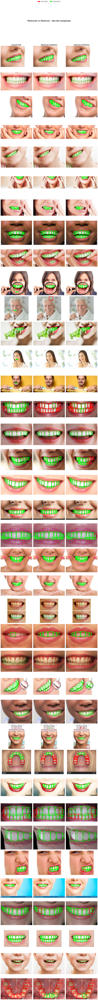

In [33]:
compare_two_yolo_models(
    YOLOv12m_path="/kaggle/working/runs/detect/train4/weights/best.pt",
    YOLOv12x_path="/kaggle/working/runs/detect/train6/weights/best.pt",
    test_dir="/kaggle/working/cavity-3/test",
    class_names=class_names,
    colors_bgr=colors_bgr,
    conf=0.25
)

<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 20px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    On the dental dataset, performance varied between the two models: <b>YOLOv12x</b> outperformed in certain cases, while <b>YOLOv12m</b> achieved better results in others when classifying normal and cavity teeth. However, in some instances, <b>both models</b> failed to detect the tooth altogether, making classification impossible.
  </p>

</div>


<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Confusion Matrix
  </h2>

</div>


WARNING ⚠️ imgsz=[150] must be multiple of max stride 32, updating to [160]
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12m summary (fused): 169 layers, 20,106,454 parameters, 0 gradients, 67.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 850.6±1269.1 MB/s, size: 50.9 KB)


val: Scanning /kaggle/working/cavity-3/test/labels.cache... 38 images, 0 backgrounds, 0 corrupt: 100%|██████████| 38/38 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]
invalid value encountered in less
invalid value encountered in less


                   all         38        529      0.568      0.701      0.622      0.351
Speed: 0.8ms preprocess, 27.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/val5
WARNING ⚠️ imgsz=[150] must be multiple of max stride 32, updating to [160]
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12x summary (fused): 283 layers, 59,045,654 parameters, 0 gradients, 198.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 899.1±1162.7 MB/s, size: 57.6 KB)


val: Scanning /kaggle/working/cavity-3/test/labels.cache... 38 images, 0 backgrounds, 0 corrupt: 100%|██████████| 38/38 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]
invalid value encountered in less
invalid value encountered in less


                   all         38        529      0.612      0.671       0.59      0.348
Speed: 0.3ms preprocess, 27.8ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val6


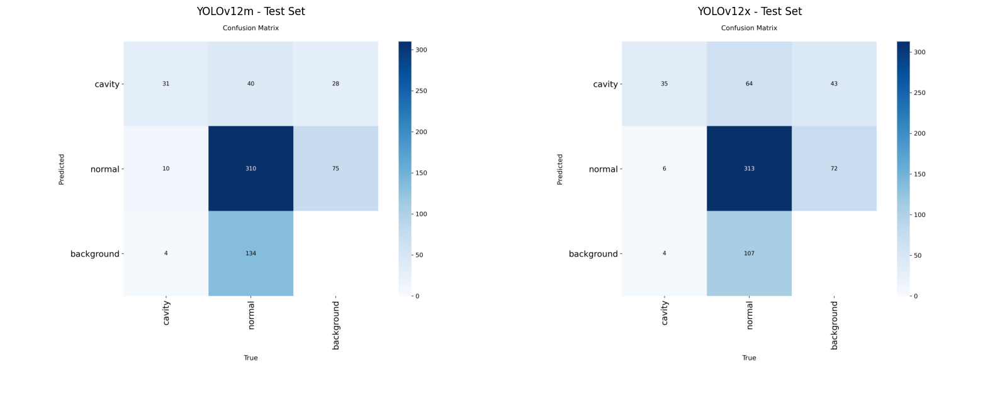

In [26]:
cm_m_path = run_val_and_get_cm(YOLOv12m_path, "YOLOv12m")
cm_x_path = run_val_and_get_cm(YOLOv12x_path, "YOLOv12x")

img_m = mpimg.imread(cm_m_path)
img_x = mpimg.imread(cm_x_path)

fig, axes = plt.subplots(1, 2, figsize=(16, 16))

axes[0].imshow(img_m)
axes[0].set_title("YOLOv12m - Test Set")
axes[0].axis("off")

axes[1].imshow(img_x)
axes[1].set_title("YOLOv12x - Test Set")
axes[1].axis("off")

plt.tight_layout()
plt.show()

<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <h2 style="color:#4AC4FF;">Confusion Matrix Comparison – YOLOv12m vs YOLOv12x</h2>

  <p style="font-size:17px; line-height:1.6; color:white;">
    The confusion matrices above compare <b>YOLOv12m</b> and <b>YOLOv12x</b> on the test set, showing predicted classes versus true classes for <b>cavity</b>, <b>normal</b>, and <b>background</b>.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    For the <b>cavity</b> class, YOLOv12m correctly identified 31 cases, misclassifying 40 as normal and 28 as background. YOLOv12x improved the correct detections to 35 but had higher confusion with normal teeth (64 vs 40 in m) and slightly higher background misclassification (43 vs 28 in m).
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    For the <b>normal</b> class, YOLOv12m achieved 310 correct predictions, while YOLOv12x slightly improved to 313. Both models confused some normal teeth as cavity (10 for m, 6 for x) and as background (75 for m, 72 for x).
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    For the <b>background</b> category, YOLOv12m labeled 134 normal teeth as background, while YOLOv12x reduced this to 107, indicating better background discrimination. Correct background predictions were equal (4 for both models).
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    Overall, YOLOv12x improved slightly in correct cavity and normal predictions, and reduced normal-to-background errors. However, it increased confusion between cavity and normal, suggesting that while the larger model is stronger at avoiding background errors, its class boundary between cavity and normal is less distinct.
  </p>

</div>


# <div id="#cd" class="title">Conclusion & Discussion</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">


  <p style="font-size:17px; line-height:1.6; color:white;">
    In this work, both <b>YOLOv12m</b> and <b>YOLOv12x</b> models were trained and evaluated on a dental dataset to classify normal and cavity teeth. Given the limited size of the dataset, future improvements could be achieved by merging related datasets containing both tooth types to increase data diversity and overall model robustness.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    While <b>YOLOv12x</b> is a larger and more computationally expensive model to train, the performance gap between YOLOv12m and YOLOv12x was relatively small. Even with data augmentation applied to YOLOv12x and training for 200 epochs (the same as YOLOv12m), YOLOv12x did not significantly outperform YOLOv12m. This suggests that, under these conditions, the added training time and resource requirements of YOLOv12x may not be justified.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    Instead, future experiments could focus on applying augmentation to YOLOv12m and extending training to more epochs (e.g., 500) to evaluate potential gains. Collecting additional data, exploring alternative object detection architectures, and performing model comparisons would also be valuable directions. Adjusting hyperparameters, such as using smaller batch sizes, may further improve accuracy and generalization.
  </p>

  <p style="font-size:17px; line-height:1.6; color:white;">
    The primary aim of this project was not to maximize performance through extensive training, but rather to demonstrate a workflow for downloading a dataset from Roboflow, preparing it for YOLO, and fine-tuning detection models. Nevertheless, the experiments have highlighted that model choice, data size, and augmentation strategies all play significant roles in achieving better results.
  </p>

</div>


# <div id="#deployment" class="title">Deployment</div>


<div style="border: 2px solid #4AC4FF; background: linear-gradient(145deg, #0A0F2C, #1B123A); padding: 25px; border-radius: 20px; box-shadow: 0 4px 12px rgba(74, 196, 255, 0.15); width: 100%; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: white;">

  <p style="font-size:17px; line-height:1.6; color:white;">
    Based on what we said in the conclusion part, the <b>YOLOv12m</b> model fine-tuned will be used to implement our web application, developed using HTML, CSS, and JavaScript.
  </p>

  <div class="button-row right">
    <a href="https://github.com/DanialSoleimany/YOLOv12-Tooth-Cavity-Detection/tree/main" class="fancy-button plum">Application</a>
  </div>

</div>


<div style="border: 2px solid #8A2BE2; background: linear-gradient(145deg, #1C0F2C, #2B124A); padding: 10px; border-radius: 20px; box-shadow: 0 4px 12px rgba(138, 43, 226, 0.25); width: 100%; max-width: 100%; margin: 0; box-sizing: border-box; font-family: 'Century Gothic', sans-serif; color: #F8F8FF; text-align: center;">

  <h2 style="color: #C084FC; font-family: Century Gothic; font-size: 18px; margin: 0;">
    Best Regards
  </h2>

</div>
